In [30]:
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import altair as alt
import pyarrow
from datetime import datetime
import simulations, utilities
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.cm as cm
from matplotlib import rcParams
import itertools
pv=!{sys.executable} --version
print(pv[0],'numpy ==', np.__version__, 'pyarrow ==',pyarrow.__version__, 'seaborn == ', sns.__version__)

Python 3.9.7 numpy == 1.20.3 pyarrow == 7.0.0 seaborn ==  0.11.2


In [31]:
# options
pd.set_option('display.max_columns', 100)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
mpl.rcParams['figure.dpi'] = 300
sns.set_style("ticks")
sns.set_palette("cubehelix")
font_scale = 2
sns.set_context("paper", font_scale=font_scale, rc={"lines.linewidth": 2, 'aspect':1})
# figure size in inches
#rcParams['figure.figsize'] = 11.7,8.27

# render altair charts as png
#alt.renderers.enable('mimetype')
# remove altair max row limit
#alt.data_transformers.disable_max_rows()


In [32]:
def plot_his(df, ci=None, concise=True, title = None, legend=True, hue=None, x = 'Time Step',  
              ys=[ 'Log Market Cap', 'Economic Gini', 'Knowledge Gini', ],  
             style='Exploration Norms', col='A'):
    n = len(ys)
    for i in range(n):
        ax=sns.relplot(aspect=1, kind="line", x=x, y=ys[i], col = col, style=style, hue=hue, ci=ci, data=df, legend=legend);#, ax=axs[i]);  

In [33]:
data = pd.read_parquet('simulations.SimulationNK_main_his.parquet')
print(data.shape)
print(data.columns)
data.head()

(214200, 22)
Index(['A', 'K', 'N', 'Companies', 'Configuration', 'Economic Gini',
       'Economic Median', 'Economic Q1', 'Economic Q3', 'Exploration Effort',
       'Exploration Norms', 'Initial Economic Stock', 'Knowledge Gini',
       'Knowledge Median', 'Knowledge Q1', 'Knowledge Q3', 'Market Capital',
       'Run', 'Seed', 'Simulation Size', 'Simulation Time', 'Time Step'],
      dtype='object')


,A,K,N,Companies,Configuration,Economic Gini,Economic Median,Economic Q1,Economic Q3,Exploration Effort,Exploration Norms,Initial Economic Stock,Knowledge Gini,Knowledge Median,Knowledge Q1,Knowledge Q3,Market Capital,Run,Seed,Simulation Size,Simulation Time,Time Step
0,0.600,1,2,100,0,0.000,100.000,100.000,100.000,10,0.100,100,-0.000,0.281,0.281,0.281,10000,0,0,100,50,0
1,0.600,1,2,100,0,0.006,76.000,76.000,76.000,10,0.100,100,0.073,0.281,0.281,0.281,7648,0,0,100,50,1
2,0.600,1,2,100,0,0.023,58.000,58.000,58.000,10,0.100,100,0.108,0.281,0.281,0.281,5956,0,0,100,50,2
3,0.600,1,2,100,0,0.053,44.000,44.000,44.000,10,0.100,100,0.141,0.281,0.281,0.494,4674,0,0,100,50,3
4,0.600,1,2,100,0,0.099,33.000,33.000,38.000,10,0.100,100,0.155,0.281,0.281,0.494,3714,0,0,100,50,4


In [34]:
data.dtypes

A                         float64
K                           int64
N                           int64
Companies                   int64
Configuration               int64
Economic Gini             float64
Economic Median           float64
Economic Q1               float64
Economic Q3               float64
Exploration Effort          int64
Exploration Norms         float64
Initial Economic Stock      int64
Knowledge Gini            float64
Knowledge Median          float64
Knowledge Q1              float64
Knowledge Q3              float64
Market Capital              int64
Run                         int64
Seed                        int64
Simulation Size             int64
Simulation Time             int64
Time Step                   int64
dtype: object

In [35]:
data.Configuration.describe()

count   214200.000
mean       376.167
std        207.370
min          0.000
25%        200.750
50%        385.500
75%        554.250
max        719.000
Name: Configuration, dtype: float64

In [36]:
data['Log Market Cap'] = np.log(1+data['Market Capital'])

In [37]:
data1 = data[data['K']==1]
data2 = data[data['K']==3]
data3 = data[data['K']==6]

# A small increase in knowledge gini is sufficient to kick start an increase in economic gini and market cap

# so a rising tide (market cap) is associated with fewer boats!

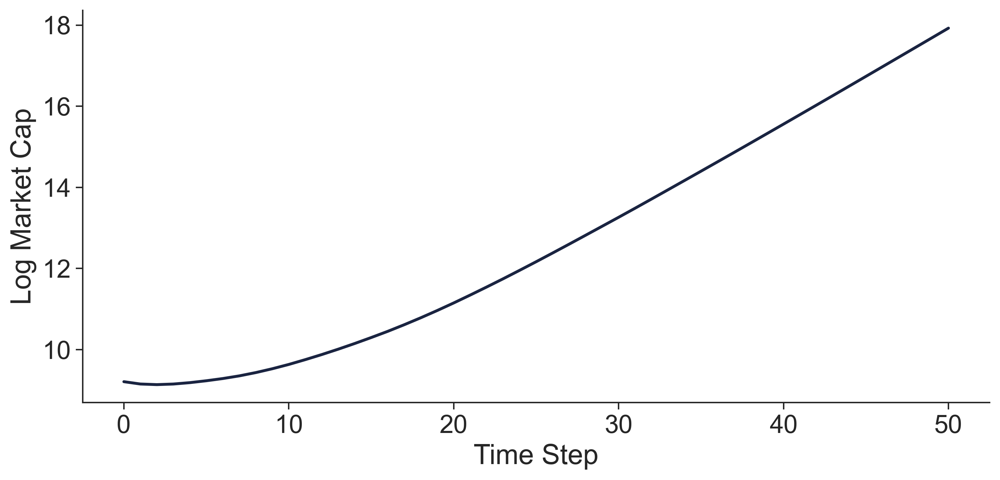

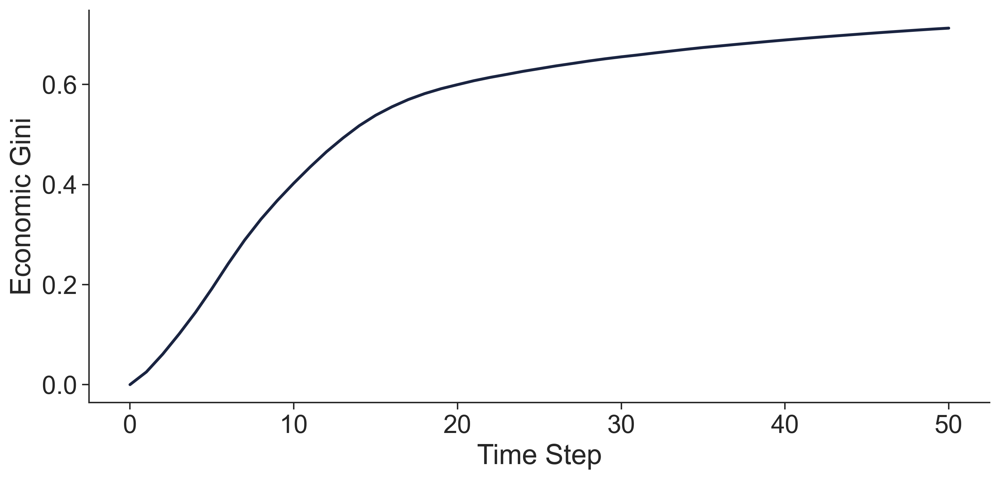

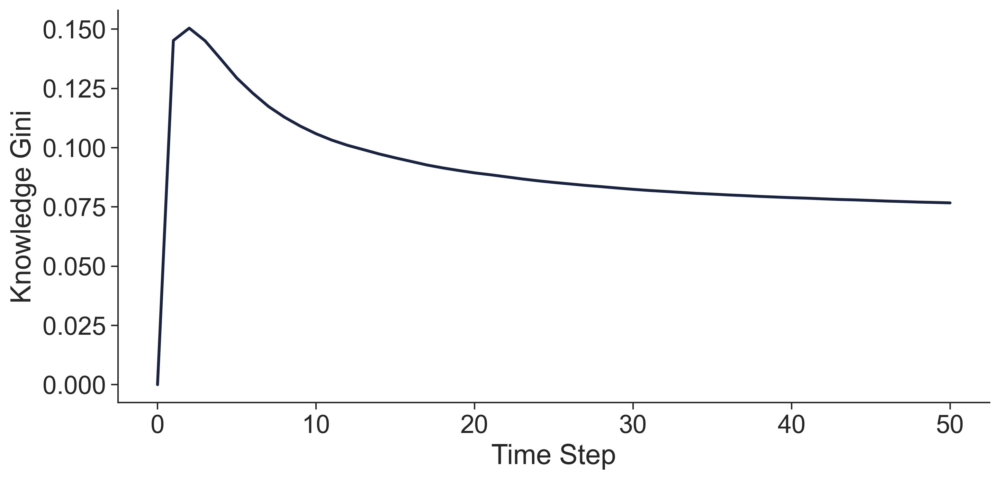

In [38]:
sns.relplot(aspect=2, kind="line", x='Time Step', y='Log Market Cap', ci=None, data=data,);
sns.relplot(aspect=2, kind="line", x='Time Step', y='Economic Gini', ci=None, data=data,);
sns.relplot(aspect=2, kind="line", x='Time Step', y='Knowledge Gini', ci=None, data=data, );

# The previous effect is more pronounced when fewer companies explore, i.e., low exploration norms
# However, when fewer companies explore, the resulting market cap is smaller (less dynamic market)

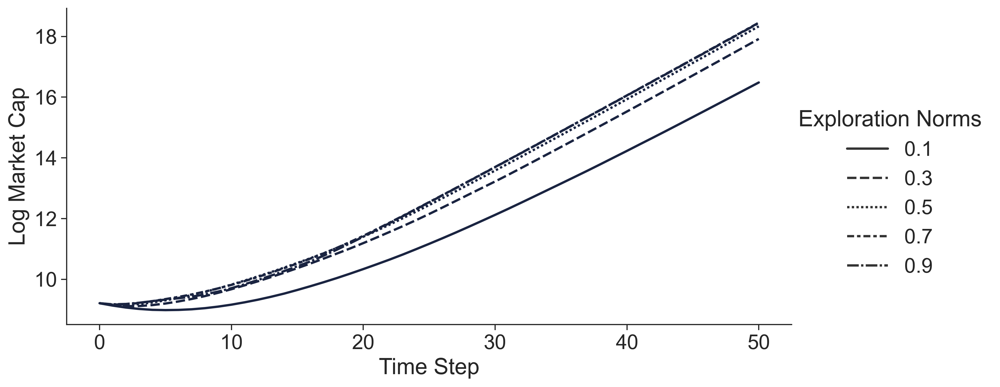

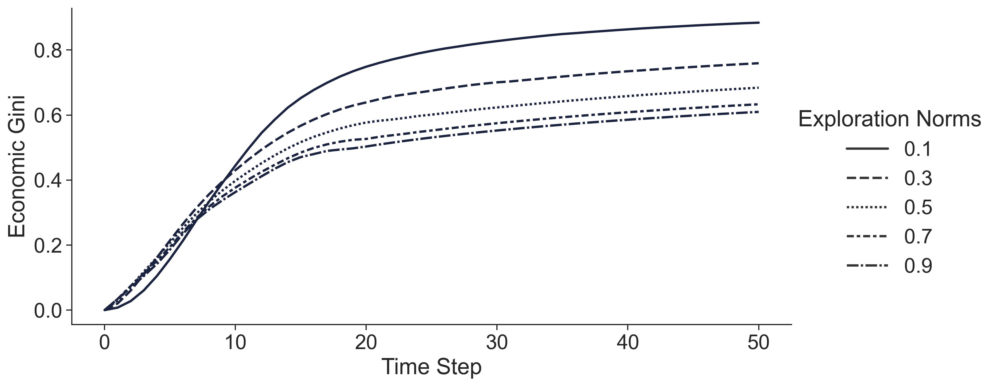

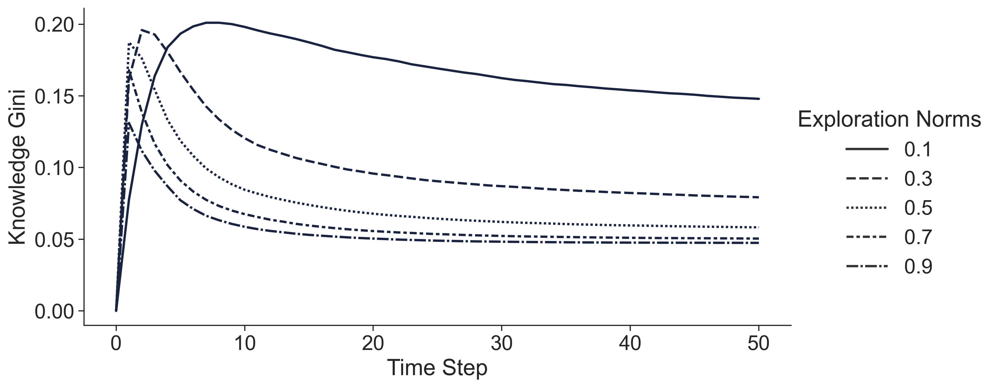

In [39]:
sns.relplot(aspect=2, kind="line", x='Time Step', y='Log Market Cap', style='Exploration Norms', ci=None, data=data,);
sns.relplot(aspect=2, kind="line", x='Time Step', y='Economic Gini', style='Exploration Norms', ci=None, data=data,);
sns.relplot(aspect=2, kind="line", x='Time Step', y='Knowledge Gini', style='Exploration Norms', ci=None, data=data, );

# markets with higher production uncertainty, lower A are riskier, but also prone to asymtric competition

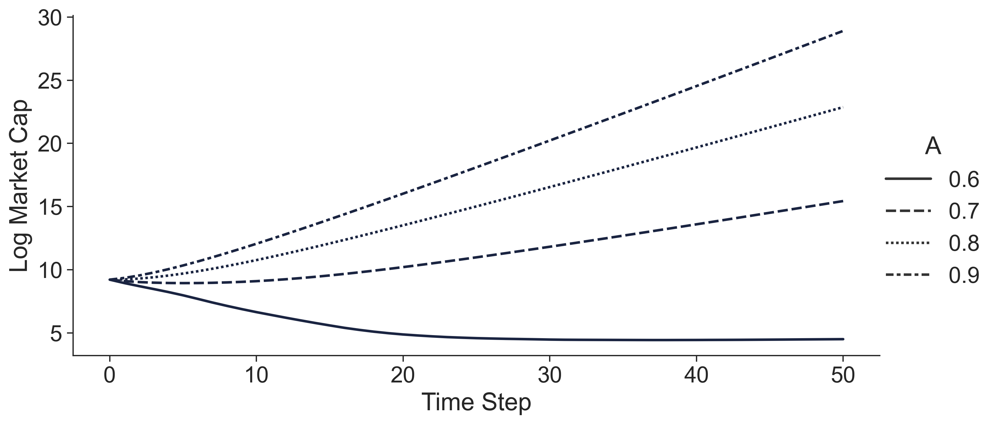

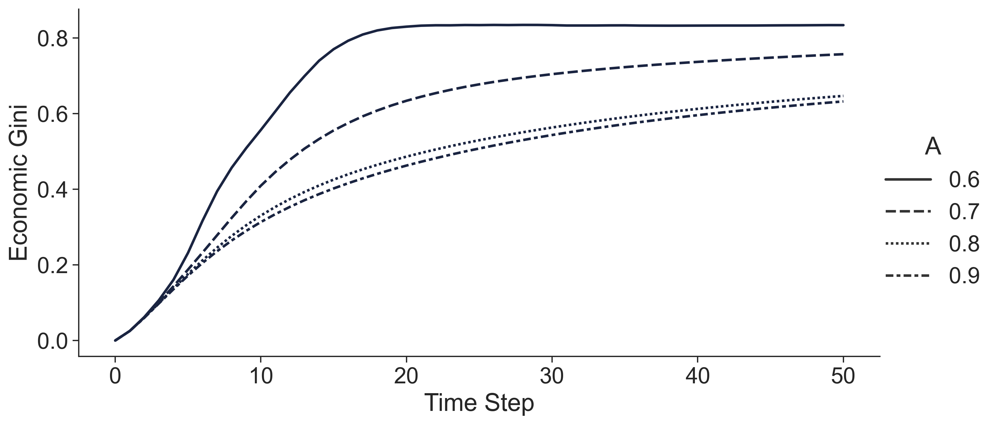

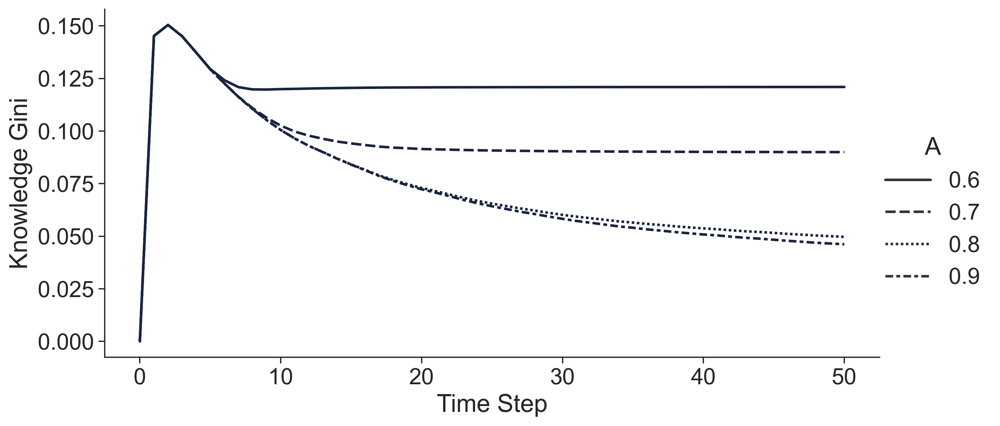

In [40]:
sns.relplot(aspect=2, kind="line", x='Time Step', y='Log Market Cap', style='A', ci=None, data=data,);
sns.relplot(aspect=2, kind="line", x='Time Step', y='Economic Gini', style='A', ci=None, data=data,);
sns.relplot(aspect=2, kind="line", x='Time Step', y='Knowledge Gini', style='A', ci=None, data=data, );

# More innovation complexity (higher K) accelerates asymmetry (winner take all because it is hard to immitate)

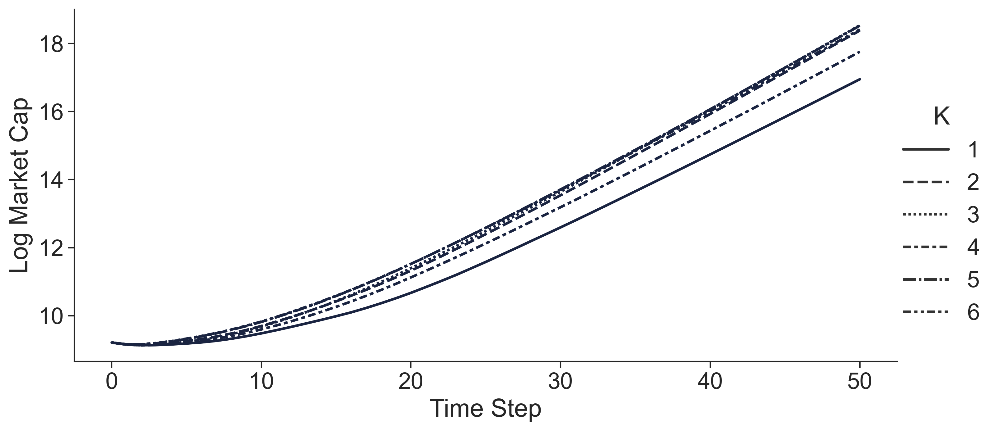

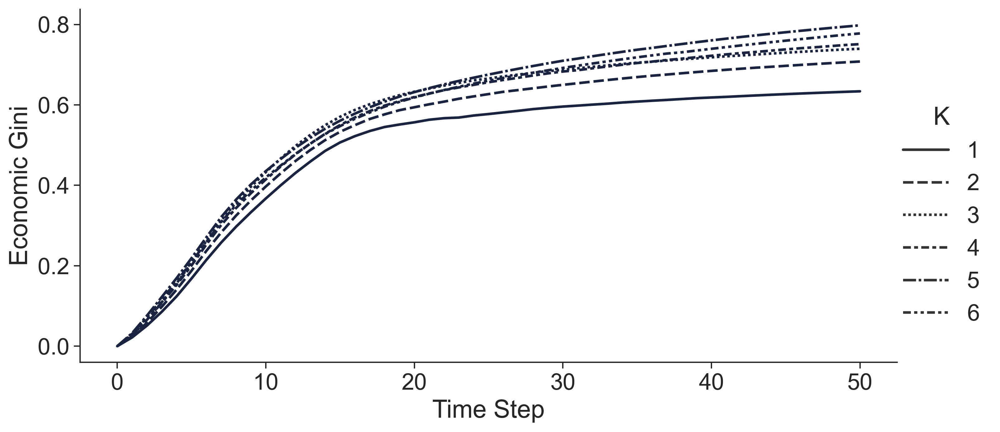

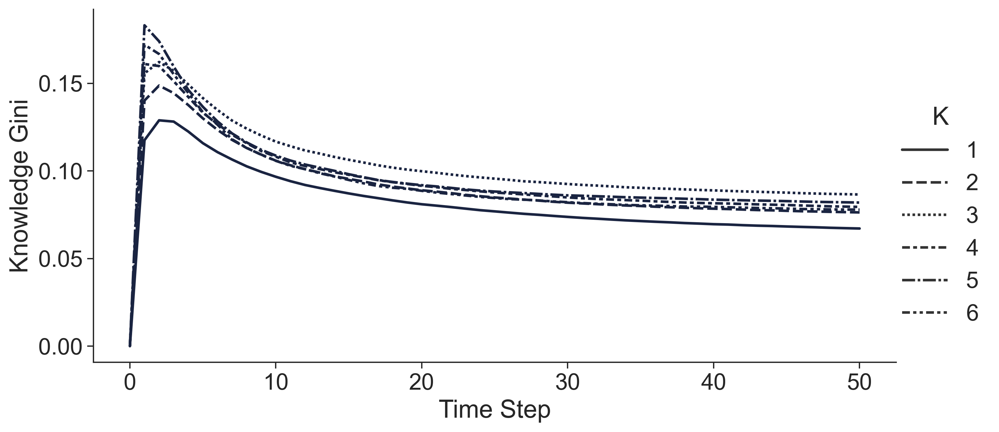

In [41]:
sns.relplot(aspect=2, kind="line", x='Time Step', y='Log Market Cap', style='K', ci=None, data=data,);
sns.relplot(aspect=2, kind="line", x='Time Step', y='Economic Gini', style='K', ci=None, data=data,);
sns.relplot(aspect=2, kind="line", x='Time Step', y='Knowledge Gini', style='K', ci=None, data=data, );

# Larger innovation landscapes (larger N) make gaining asymmetry difficult because of the many local maxima

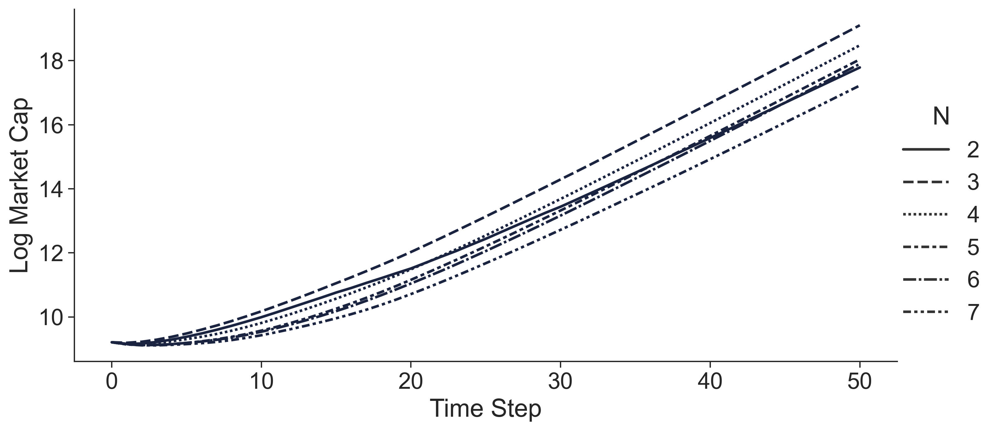

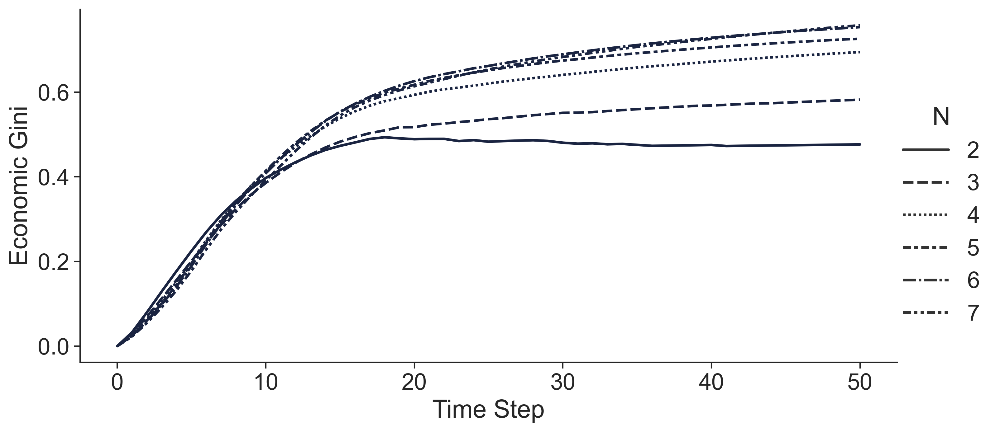

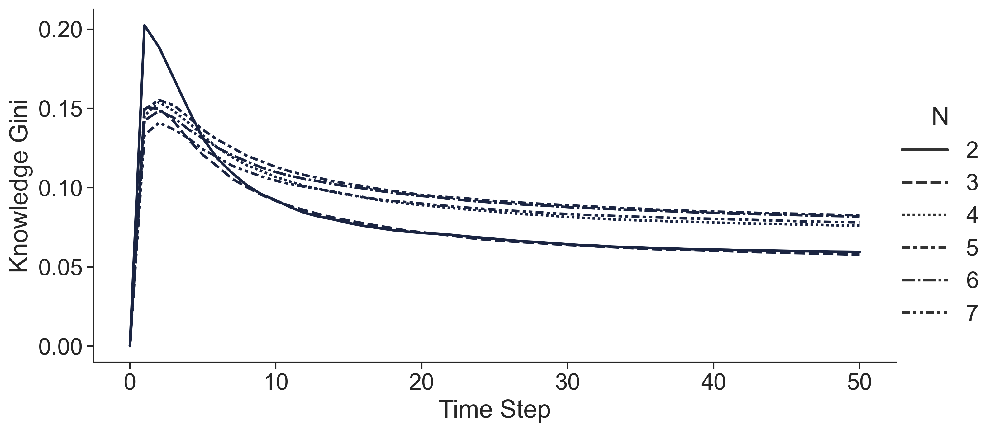

In [42]:
sns.relplot(aspect=2, kind="line", x='Time Step', y='Log Market Cap', style='N', ci=None, data=data,);
sns.relplot(aspect=2, kind="line", x='Time Step', y='Economic Gini', style='N', ci=None, data=data,);
sns.relplot(aspect=2, kind="line", x='Time Step', y='Knowledge Gini', style='N', ci=None, data=data, );

# combo plots

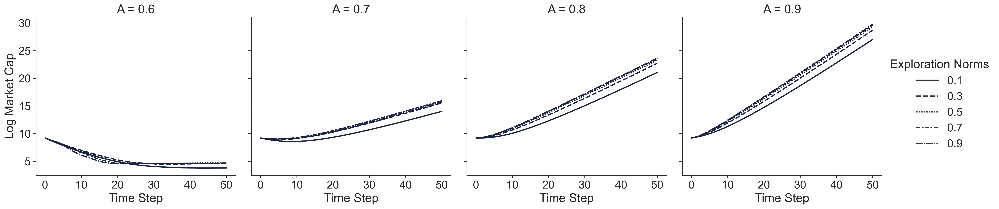

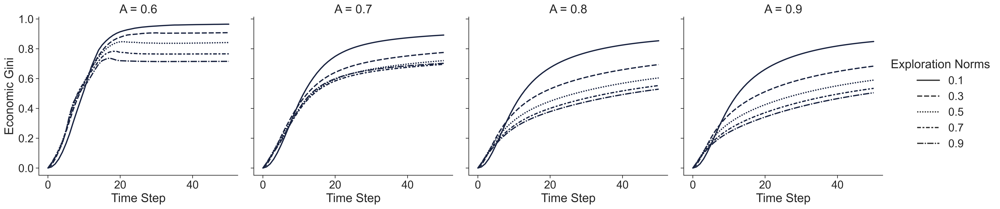

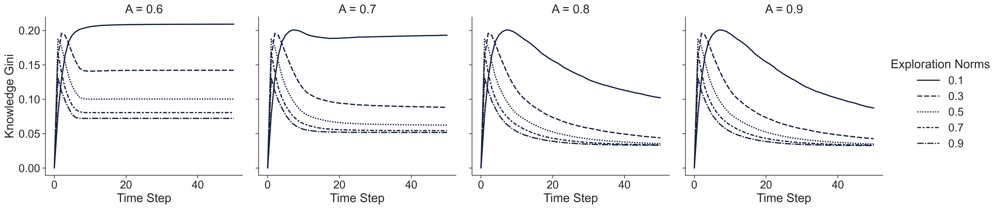

In [43]:
plot_his(data)

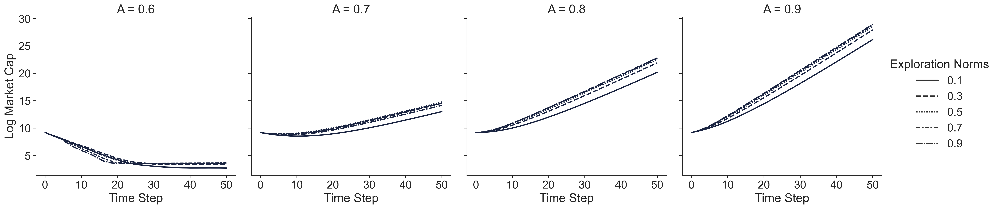

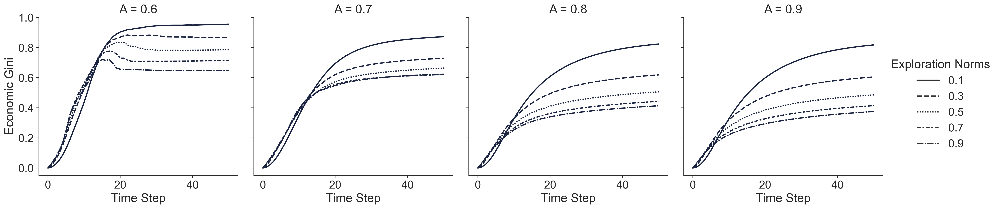

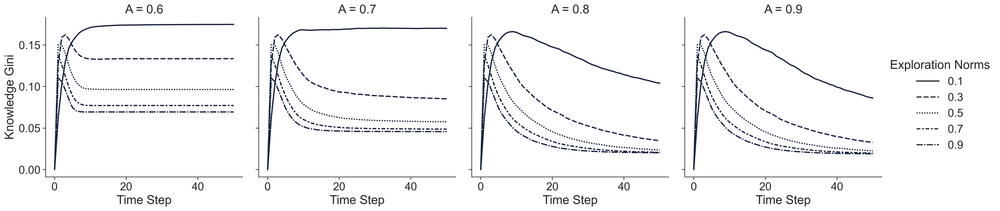

In [44]:
plot_his(data1)

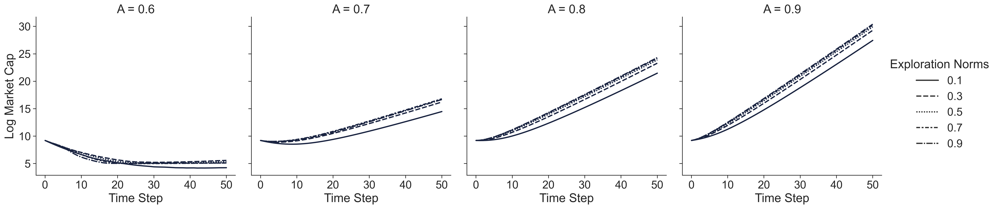

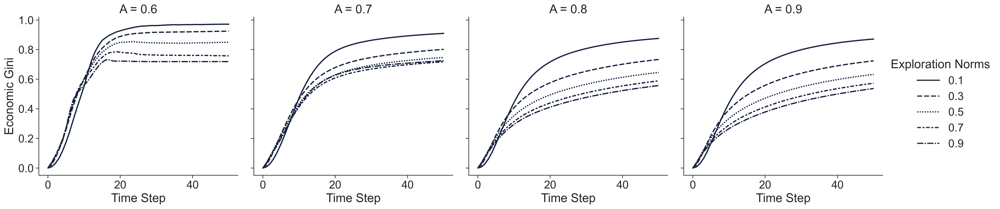

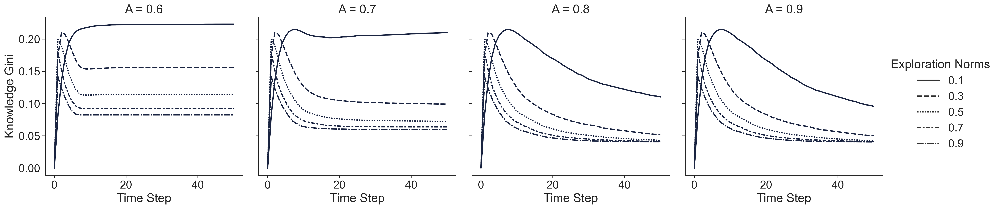

In [45]:
plot_his(data2)

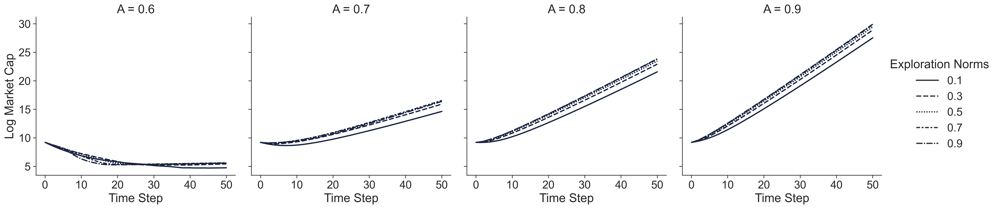

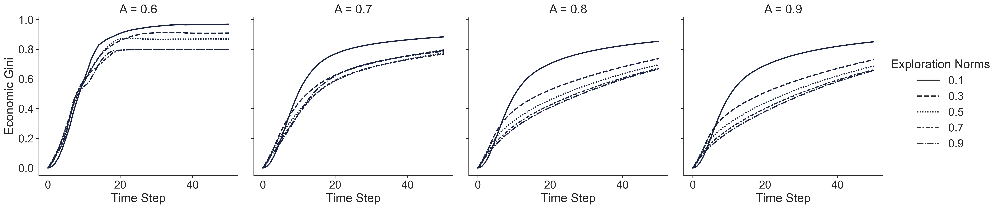

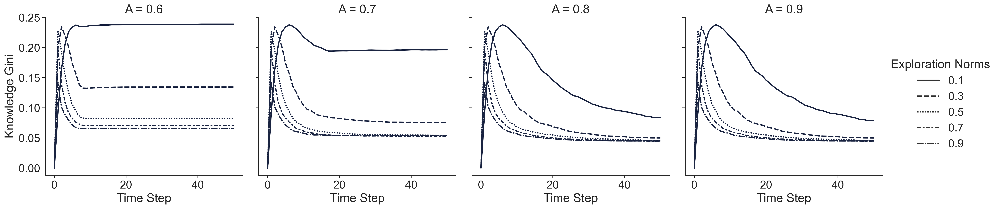

In [46]:
plot_his(data3)

<AxesSubplot:xlabel='Time Step', ylabel='Knowledge Median'>

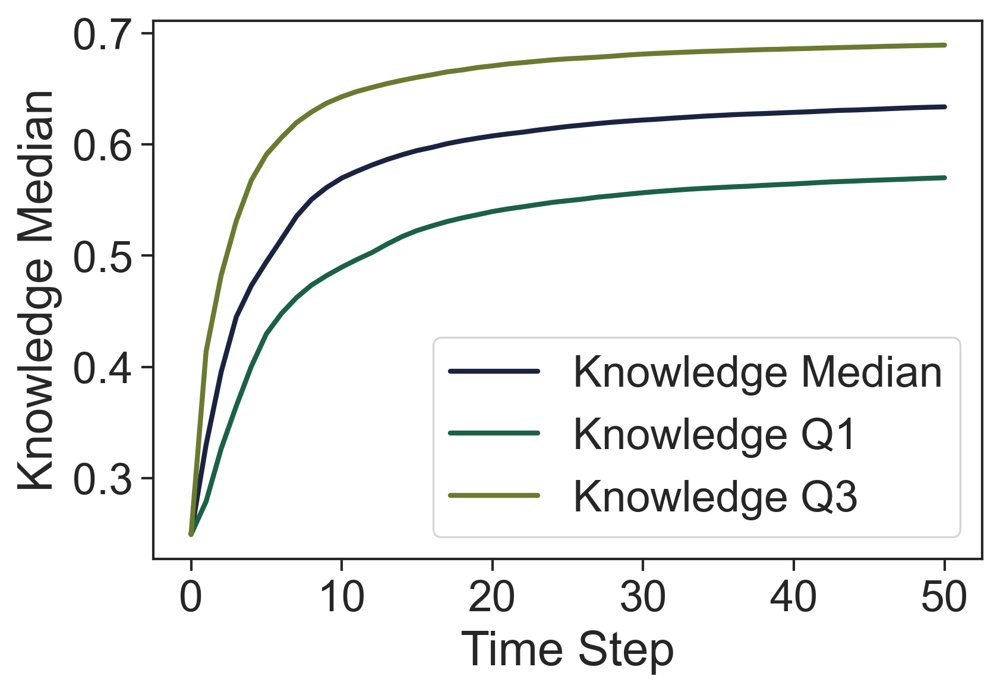

In [47]:
# plot Knowledge Median, Knowledge Q1, and Knowledge Q3 on the same plot, where the median is a line and the Q1 and Q3 are the shaded area
sns.lineplot(x='Time Step', y='Knowledge Median', data=data, label='Knowledge Median', ci=None)
sns.lineplot(x='Time Step', y='Knowledge Q1', data=data, label='Knowledge Q1', ci=None)
sns.lineplot(x='Time Step', y='Knowledge Q3', data=data, label='Knowledge Q3', ci=None)


<AxesSubplot:xlabel='Time Step', ylabel='Economic Median'>

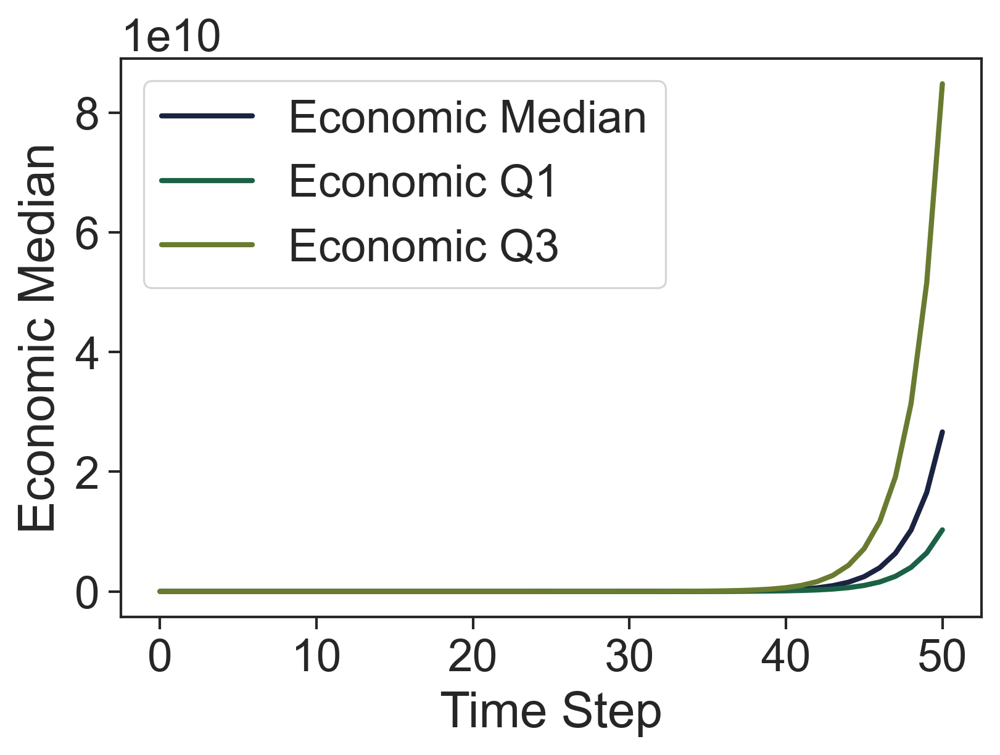

In [48]:
# plot Knowledge Median, Knowledge Q1, and Knowledge Q3 on the same plot, where the median is a line and the Q1 and Q3 are the shaded area
sns.lineplot(x='Time Step', y='Economic Median', data=data, label='Economic Median', ci=None)
sns.lineplot(x='Time Step', y='Economic Q1', data=data, label='Economic Q1', ci=None)
sns.lineplot(x='Time Step', y='Economic Q3', data=data, label='Economic Q3', ci=None)